# Modelling Lips State Detection Using CNN for Non-verbal Communications
## Research Project By: Abtahi Ishmam, Mahmudul Hasan, Md. Saif Hassan Onim, Koushik Roy, Md. Akiful Hoque Akif & Hussain Nyeem
### Link: https://link.springer.com/chapter/10.1007/978-981-19-2445-3_5

## Step 1: Importing necessary libraries

In [1]:
# -*- coding: utf-8 -*-
"""
Created on Sun May 23 21:37:50 2021

@author: Abtahi Ishmam

"""
import cv2
import mediapipe as mp
import pandas as pd 
import math 
import numpy as np
import time
import joblib
import os
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

import warnings

# Suppress all warnings
warnings.filterwarnings("ignore")

# Your code here

# Reset warnings to the default behavior (optional)
warnings.filterwarnings("default")

## Step 2: Defining necessary variables

In [2]:
# CV2 Font and Text Properties
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_thickness = 2
font_color = (0, 0, 0)  # Black color
radius = 2
color = (255, 255, 255)
thickness = 2

# Position to place the text
text_position = (50, 150)

In [3]:
# Mediapipe variables
mp_drawing = mp.solutions.drawing_utils
drawing_spec = mp_drawing.DrawingSpec(thickness=1, circle_radius=1)
mp_face_mesh = mp.solutions.face_mesh
mp_face_detection = mp.solutions.face_detection
point_list = [37, 0, 267, 84, 17, 314]

# Variables necessary for distance calculation
relevant_coordinate_indice = [(0,3), (1,4), (2,5), (0,4), (1,3)]
distance_names = ['Distance Left', 'Distance Right', 'Distance Middle', 'Diagonal 1', 'Diagonal 2']
distances = {}
for i in distance_names:
    distances[i] = []

In [4]:
distances

{'Distance Left': [],
 'Distance Right': [],
 'Distance Middle': [],
 'Diagonal 1': [],
 'Diagonal 2': []}

## Step 3: Defining custom functions using mediapipe

### 3a. Crop out the face

In [5]:
def face_crop(image):
    '''
    Takes an image as input, crops out the face if detected and returns as image
    '''
    # Read images with OpenCV.
    height, width, channels = image.shape
    with mp_face_detection.FaceDetection(min_detection_confidence=0.5) as face_detection:
        results = face_detection.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        
        # Draw face detections of each face.
        xmin = int(results.detections[0].location_data.relative_bounding_box.xmin * width)
        ymin = int(results.detections[0].location_data.relative_bounding_box.ymin * height)
        width = int(results.detections[0].location_data.relative_bounding_box.width * width)
        height = int(results.detections[0].location_data.relative_bounding_box.height * height)
        crop_img = image[ymin:ymin+height,xmin:xmin+width]
        
        crop_img = cv2.resize(crop_img,(300,300),fx=0,fy=0, interpolation = cv2.INTER_NEAREST)
        
        return crop_img

### 3b. Calculate distance with facial landmarks

In [6]:
def distance_calculator(pc, coordinates, width, height, distance_name):
    '''
    Calculates cartesian plane distance from coordinates
    '''
    a, b = coordinates
    distance = math.sqrt(((pc[a][0]/width - pc[b][0]/width)**2)+((pc[a][1]/height - pc[b][1]/height)**2))
    # print(f'{distance_name} = {distance}')
    return distance

def face_mesh_lip_detector(image):
    '''
    Extracts relevant landmarks using mediapipe to detect lip position and coordinates
    '''
    with mp_face_mesh.FaceMesh(min_detection_confidence=0.5,min_tracking_confidence=0.5) as face_mesh:
        
        image = cv2.cvtColor(cv2.flip(image, 1), cv2.COLOR_BGR2RGB)
        height, width, channels = image.shape
        image.flags.writeable = False # For better performance
        results = face_mesh.process(image)

        # Draw the face mesh annotations on the image.
        image.flags.writeable = True
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        if results.multi_face_landmarks:
            lm = results.multi_face_landmarks[0]
            pc = []
            for i in point_list:
                x = int(lm.landmark[i].x * width)
                y = int(lm.landmark[i].y * height)
                pc.append((x,y))
                cv2.circle(image, (x,y), radius, color, thickness)

            distance_vector = []

            for i in range(len(distance_names)):
                distance_vector.append(distance_calculator(pc ,relevant_coordinate_indice[i], width, height, distance_names[i]))

            return image, distance_vector

def lip_data_collector(image):
    '''
    Uses face_crop and face_mesh_lip_detector to return annotated lip landmark positions and 2D distances
    '''
    mod_image = face_crop(image) 
    try:
        det_image, distance_vector = face_mesh_lip_detector(mod_image)
        status = 1
    except Exception as e:
        print(f'Error: {e}')
        
    return det_image, distance_vector

## Step 4: Apply custom functions on realtime data and observe output

In [7]:
def realtime_lip_detector(distance_names, distances, relevant_coordinate_indice):
    '''
    Realtime lip movement can be tracked and detected with this function
    '''
    cap = cv2.VideoCapture(0)
    value = False
    frame_no=0
    prev_time = 0
    while(True):
        # Capture frame-by-frame
        ret, frame = cap.read()
        # Our operations on the frame come here        
        if ret:
            try:
                frame_list.append(frame_no)
                print(f'Frame No: {frame_no}')
                
                new_time = time.time()
                fps = 1//(new_time-prev_time)

                text = f'FPS: {fps}'
                
                # Use cv2.putText() to add text to the image
                cv2.putText(frame, text, text_position, font, font_scale, font_color, font_thickness)

                cv2.imshow("Original Frame", frame)
                
                prev_time = new_time                

                Output_image, distance_vector = lip_data_collector(frame)
                
                for j in range(len(distance_names)):
                    distances[distance_names[j]].append(distance_vector[j])

                value = True
                frame_no+=1
                
                # Display the resulting frame
                if value:
                    cv2.imshow('Output', Output_image)
                    
            except Exception as e:
                # Print the error message
                print(f"An error occurred: {e}")
                value = False
        
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # When everything done, release the capture
    cap.release()
    cv2.destroyAllWindows()
    return distances

In [19]:
# Uncomment the line below to check realtime performance
# distances = realtime_lip_detector(distance_names, distances, relevant_coordinate_indice)

## Step 5: Gather data for lip state classifier model

In [9]:
train_dir = {
    'Open': 'Train_Images/open',
    'Closed': 'Train_Images/closed'
}

open_image_list = os.listdir(train_dir['Open'])
closed_image_list = os.listdir(train_dir['Closed'])

def get_training_data(distances, distance_names, open_image_list, closed_image_list, train_dir):
    results = []
    for image_no, i in enumerate(open_image_list+closed_image_list):
        image = cv2.imread(f'Train_Images/open/{i}') if image_no<len(open_image_list) else cv2.imread(f'Train_Images/closed/{i}')
        try:
            _, distance_vector = lip_data_collector(image)
            for index, j in enumerate(distance_vector):
                distances[distance_names[index]].append(j)
            results.append(0 if image_no<len(open_image_list) else 1)
        except Exception as e:
            print(f'Error: {e}')

    distances['results'] = results
    print(distances)
    return pd.DataFrame(distances)

In [10]:
dataset = get_training_data(distances, distance_names, open_image_list, closed_image_list, train_dir)

Error: cannot unpack non-iterable NoneType object
Error: local variable 'det_image' referenced before assignment
{'Distance Left': [0.2909371829870572, 0.14035668847618202, 0.24020824298928628, 0.18714225130157597, 0.21356757972855123, 0.1797838208021573, 0.12369316876852982, 0.0833999733546454, 0.11338234234463294, 0.15336956093769785, 0.13152946437965907, 0.1310640216755832, 0.09758187445536298, 0.09386751893552475, 0.1201850425154663, 0.07280109889280514, 0.10354816378006039, 0.12041594578792295, 0.0902465758045392, 0.1268419839362697], 'Distance Right': [0.2969661409805651, 0.14035668847618202, 0.24335616331258636, 0.18381754238616307, 0.2209072203437452, 0.18764623926716764, 0.12292725943057183, 0.08006941432976206, 0.11005049346146117, 0.15333333333333343, 0.12775845264491192, 0.12775845264491204, 0.094809751022186, 0.0902465758045393, 0.11685698761972071, 0.07063206700139028, 0.10005554013202421, 0.11709445380166866, 0.08692269873603532, 0.1233333333333334], 'Distance Middle': [

In [11]:
len(dataset['Distance Left'])

20

In [12]:
len(dataset['results'])

20

In [13]:
dataset.columns

Index(['Distance Left', 'Distance Right', 'Distance Middle', 'Diagonal 1',
       'Diagonal 2', 'results'],
      dtype='object')

In [14]:
dataset.to_csv('train.csv', index=False)

## Step 6: Train an SVC model with the dataset and predict for test images

### 6a. Performing grid search to find the best estimator

In [15]:
param_grid = {
    'C':[0.1, 1, 10, 100, 1000],
    'gamma':[0.1, 1, 10, 100, 1000],
}
grid = GridSearchCV(SVC(), param_grid=param_grid, verbose=3)
df = pd.read_csv('train.csv')
X = df.drop(['results'], axis=1)
y = df['results']
grid.fit(X, y)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ..................C=0.1, gamma=0.1;, score=0.500 total time=   0.0s
[CV 2/5] END ..................C=0.1, gamma=0.1;, score=0.500 total time=   0.0s
[CV 3/5] END ..................C=0.1, gamma=0.1;, score=0.750 total time=   0.0s
[CV 4/5] END ..................C=0.1, gamma=0.1;, score=0.750 total time=   0.0s
[CV 5/5] END ..................C=0.1, gamma=0.1;, score=0.750 total time=   0.0s
[CV 1/5] END ....................C=0.1, gamma=1;, score=0.500 total time=   0.0s
[CV 2/5] END ....................C=0.1, gamma=1;, score=0.500 total time=   0.0s
[CV 3/5] END ....................C=0.1, gamma=1;, score=0.750 total time=   0.0s
[CV 4/5] END ....................C=0.1, gamma=1;, score=0.750 total time=   0.0s
[CV 5/5] END ....................C=0.1, gamma=1;, score=0.750 total time=   0.0s
[CV 1/5] END ...................C=0.1, gamma=10;, score=0.500 total time=   0.0s
[CV 2/5] END ...................C=0.1, gamma=10

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [0.1, 1, 10, 100, 1000]},
             verbose=3)

In [16]:
grid.best_estimator_

SVC(C=1, gamma=10)

### 6b. Defining a lips state classifier function that takes the image and the classifier model as input

In [17]:
def lip_state_classifier(frame, model):

    prev_time = time.time()
    frame2 = face_crop(frame) 
    Enhanced, distance = face_mesh_lip_detector(frame2)
    
    input_params = np.array(distance)
    
    new_time = time.time()
    fps = 1//(new_time-prev_time)
    prev_time = new_time

    if model.predict(input_params.reshape(1, -1)) == 0:
        results = 'Open'
    else:
        results = 'Close'

    font = cv2.FONT_HERSHEY_SIMPLEX
    # org
    org = (50, 50)
    # fontScale
    fontScale = 0.5
    thickness = 1

    text1 = f'FPS: {fps} Mouth: {results}'
    cv2.putText(Enhanced, text1, (50,50), font, fontScale, color, thickness, cv2.LINE_AA)

    # Convert BGR image to RGB (Matplotlib uses RGB)
    image_rgb = cv2.cvtColor(Enhanced, cv2.COLOR_BGR2RGB)

    return image_rgb

### 6c. Performing tests on real world test images

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


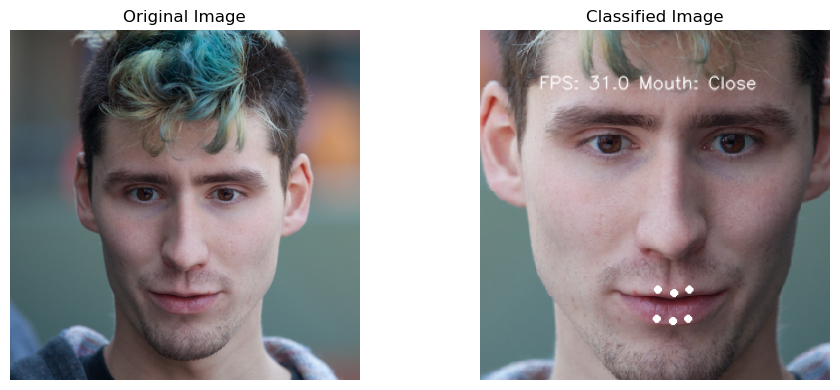

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


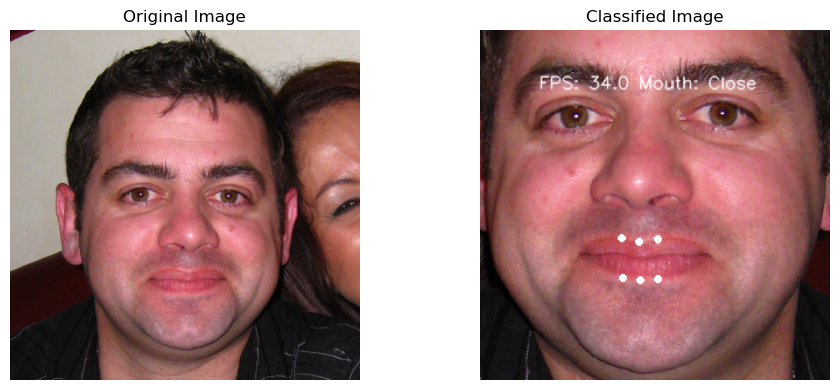

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


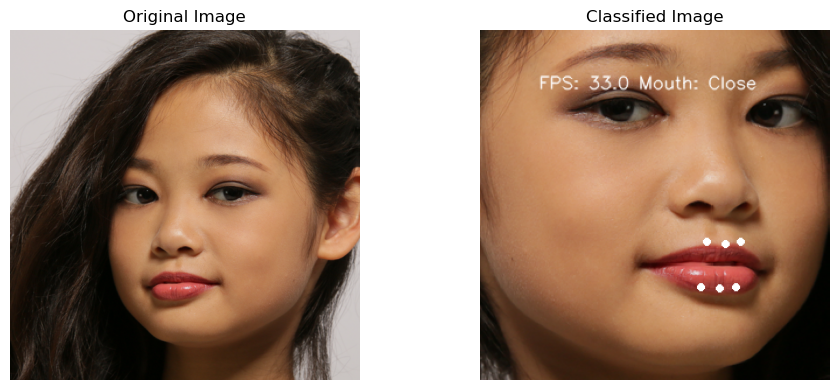

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


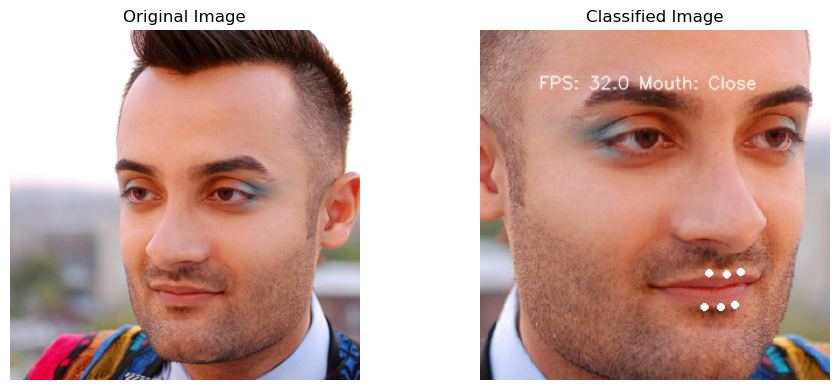

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


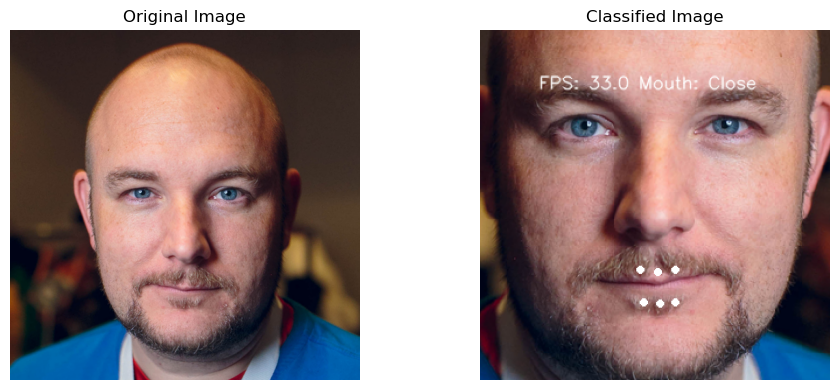

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


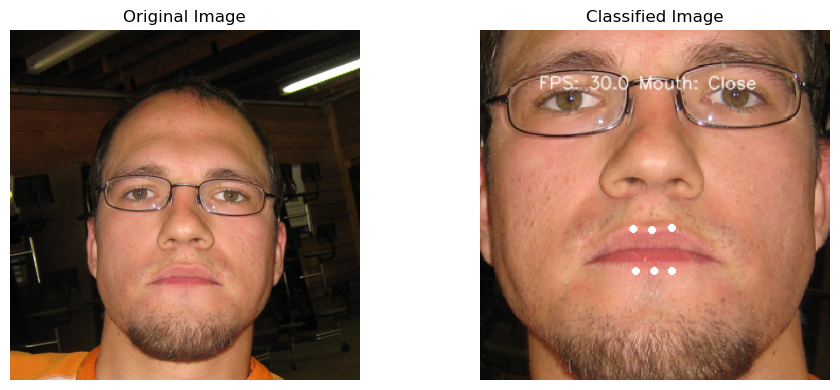

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


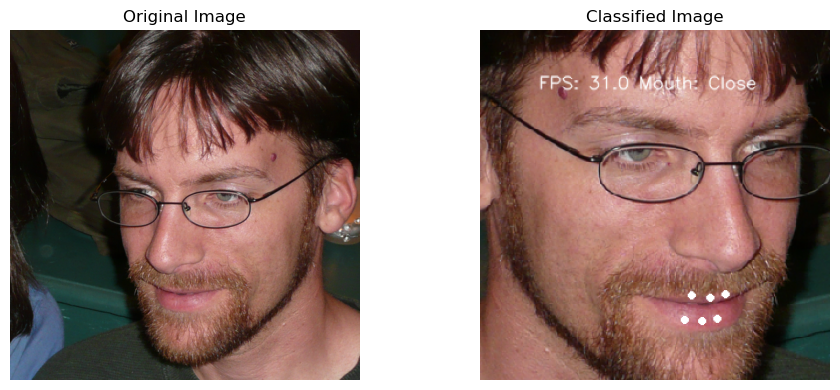

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


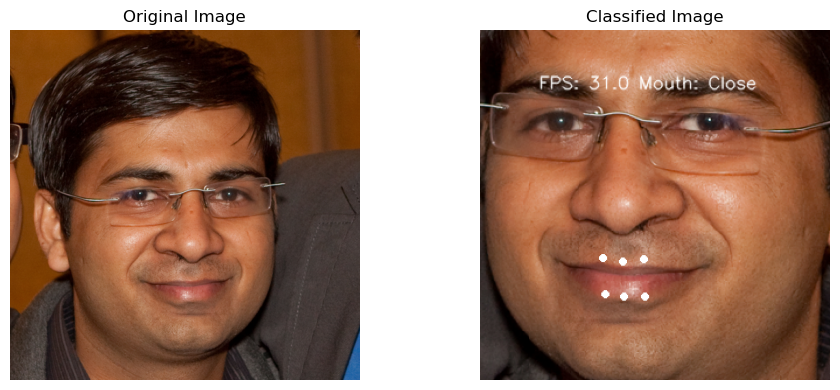

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


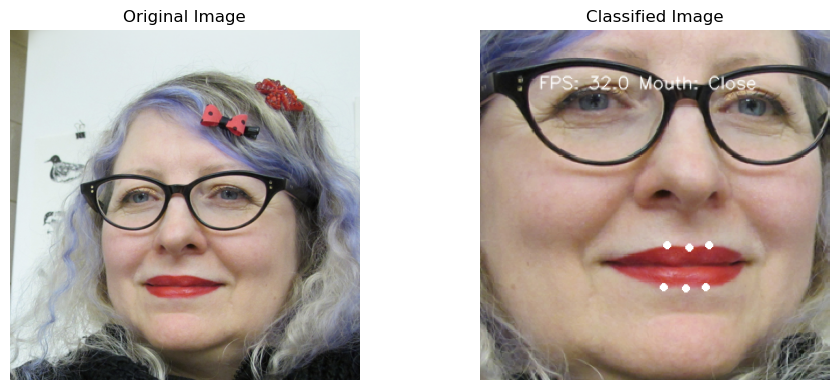

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


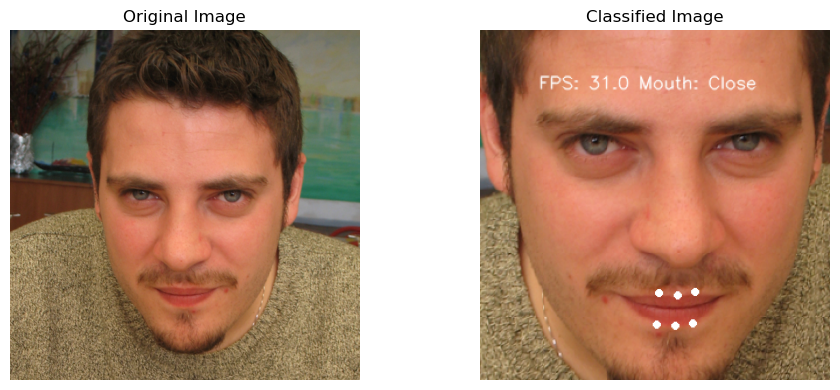

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


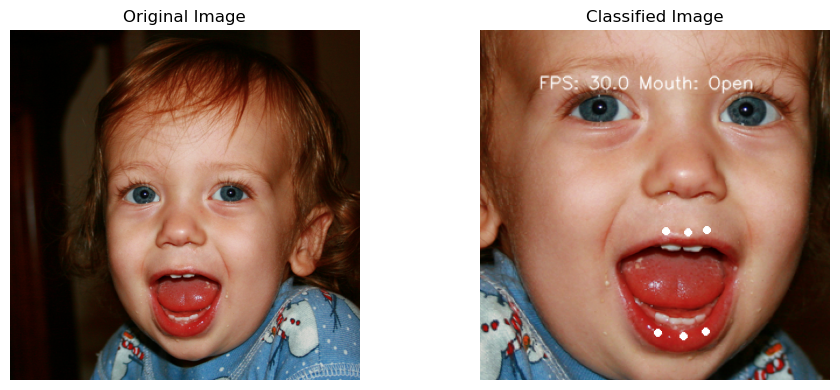

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


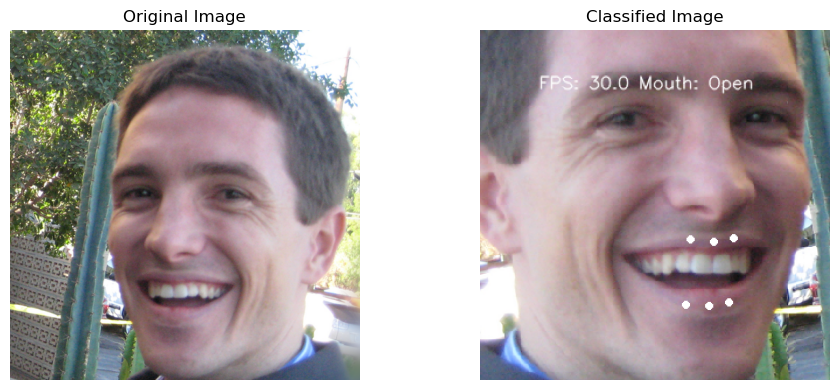

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


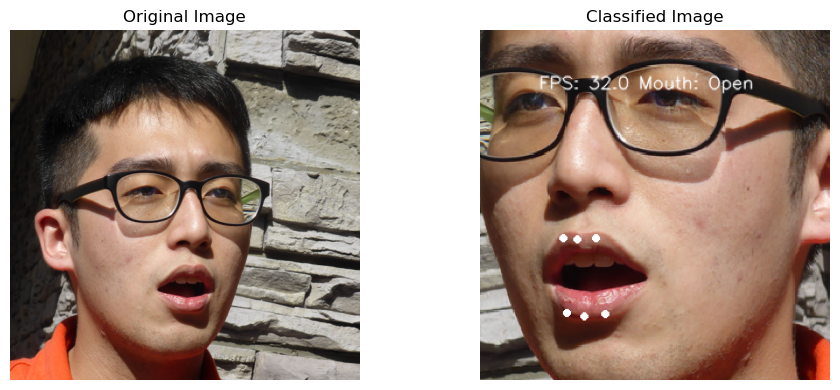

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


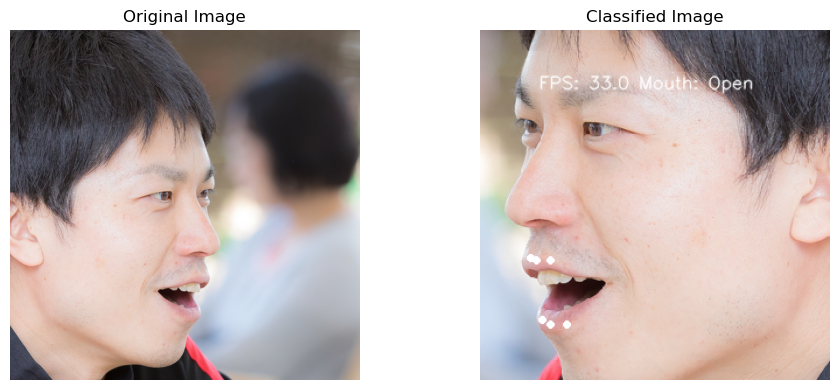

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


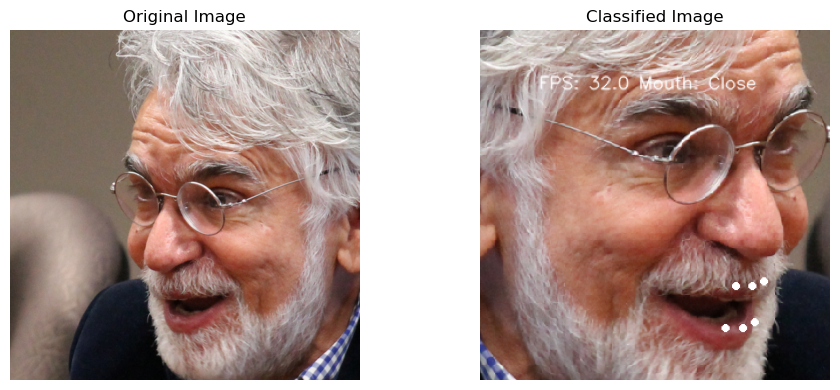

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


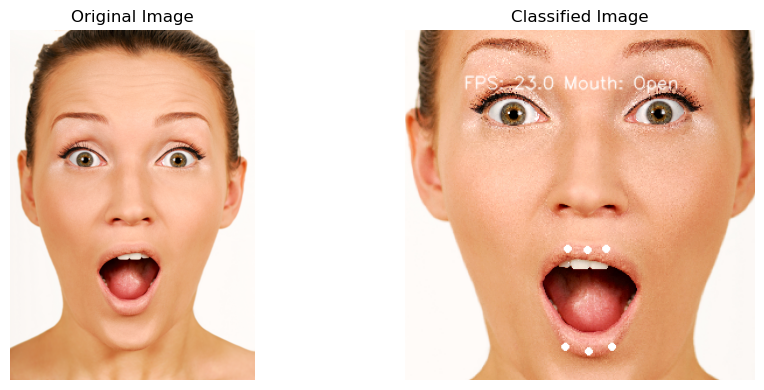

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


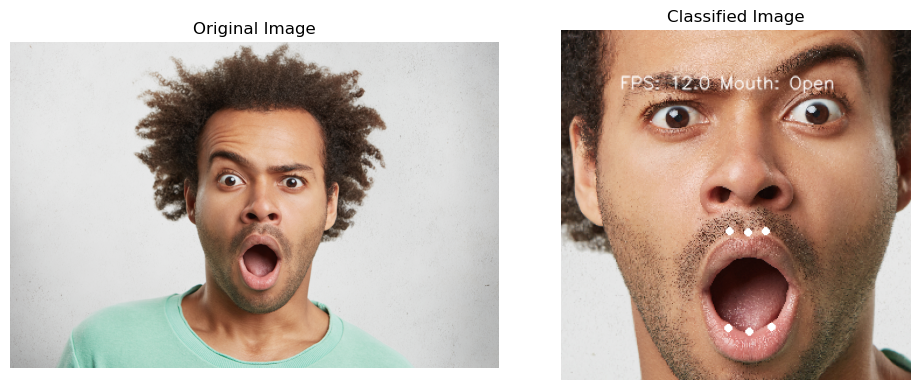

C:\ProgramData\Anaconda3\envs\Mediapipe_Lip\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


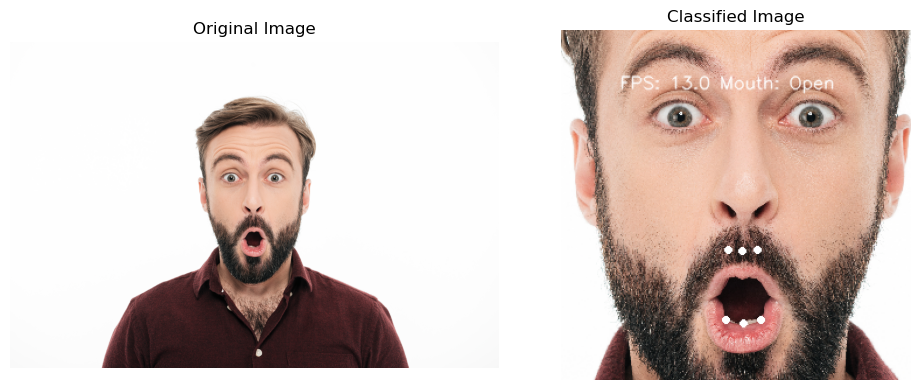

In [18]:
image_list = os.listdir('Test_Images')

for image in image_list:
    try:
        # Load an example image (replace this with your image path)
        image = cv2.imread(f'Test_Images/{image}')
        # Convert BGR image to RGB (Matplotlib uses RGB)
        image1 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Create a figure and a grid of subplots (1 row, 2 columns)
        fig, axs = plt.subplots(1, 2, figsize=(10, 4))
        
        # Display the first image in the first subplot
        axs[0].imshow(image1, cmap='gray')
        axs[0].set_title('Original Image')
    
        image2 = lip_state_classifier(image, grid)
        
        # Display the second image in the second subplot
        axs[1].imshow(image2)
        axs[1].set_title('Classified Image')
        
        # Hide the axes ticks and labels
        for ax in axs:
            ax.axis('off')
        
        # Adjust layout to prevent clipping of titles and labels
        plt.tight_layout()
        
        # Show the plots
        plt.show()
    except Exception as e:
        print(f'Error: {e}')

NOTE: The model demonstrated here and the dataset provided are not the actual datasets used in the research paper.
The dataset here is only for demonstrative purposes and therefore performance will vary with datasets.